<a href="https://www.kaggle.com/code/mikedelong/python-maps-of-schools-mostly?scriptVersionId=141285572" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np
import pandas as pd

def map_strings(arg):
    if isinstance(arg, float):
        return arg
    return np.nan
    
df = pd.read_csv('/kaggle/input/us-public-schools/us-public-schools.csv', sep=';', index_col=['OBJECTID'],
                 parse_dates=['VAL_DATE', 'SOURCEDATE']).drop(columns=['NAICS_CODE', 'NAICS_DESC'])
df['POPULATION'] = df['POPULATION'].replace(-999, np.nan).apply(map_strings)
df['ENROLLMENT'] = df['ENROLLMENT'].replace(-999, np.nan).apply(map_strings)

df.head()

,Geo Point,Geo Shape,NCESID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,...,VAL_METHOD,VAL_DATE,WEBSITE,LEVEL_,ENROLLMENT,ST_GRADE,END_GRADE,DISTRICTID,FT_TEACHER,SHELTER_ID
OBJECTID,,,,,,,,,,,,,,,,,,,,,
13,"34.92515730700006, -120.45033928799995","{""coordinates"": [-120.45033928799995, 34.92515...",60558013869,JIM NEZ ROBERTO AND DR. FRANCISCO ELEMENTARY,1970 S. BISCAYNE ST.,SANTA MARIA,CA,93458,3411,(805) 361-4340,...,IMAGERY/OTHER,2018-10-24 00:00:00+00:00,http://www.smbsd.org,OTHER,895.0,KG,07,605580,37,NOT AVAILABLE
55,"30.24770499400006, -92.01047959199997","{""coordinates"": [-92.01047959199997, 30.247704...",220026302405,WILLOW CHARTER ACADEMY,1818 NORTHEAST EVANGELINE THROUGHWAY,LAFAYETTE,LA,70501,NOT AVAILABLE,(337) 534-8218,...,IMAGERY/OTHER,2018-10-29 00:00:00+00:00,NOT AVAILABLE,ELEMENTARY,648.0,KG,08,2200263,33,NOT AVAILABLE
60,"29.878383377000034, -90.03124305199998","{""coordinates"": [-90.03124305199998, 29.878383...",220084002419,JEFFERSON RISE CHARTER SCHOOL,501 LAPALCO BLVD,GRETNA,LA,70056,7304,(504) 410-5905,...,IMAGERY/OTHER,2018-10-29 00:00:00+00:00,NOT AVAILABLE,HIGH,612.0,06,11,2200840,25,NOT AVAILABLE
89,"29.864600649000067, -95.44033647099997","{""coordinates"": [-95.44033647099997, 29.864600...",480771017014,DREW ACADEMY,1910 W LITTLE YORK RD,HOUSTON,TX,77091,1914,(281) 878-0360,...,IMAGERY,2018-10-24 00:00:00+00:00,http://www.aldineisd.org,ELEMENTARY,502.0,07,08,4807710,37,NOT AVAILABLE
132,"32.37377843500008, -112.859581817","{""coordinates"": [-112.859581817, 32.3737784350...",40075202792,PCJTED - AJO HIGH SCHOOL,111 N WELL RD,AJO,AZ,85321,1840,(520) 387-7601,...,IMAGERY/OTHER,2017-10-31 00:00:00+00:00,NOT AVAILABLE,NOT REPORTED,0.0,09,12,400752,-999,NOT AVAILABLE


In [2]:
df[['ENROLLMENT']].dtypes

ENROLLMENT    float64
dtype: object

In [3]:
df.shape

(107299, 30)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107299 entries, 13 to 107250
Data columns (total 30 columns):
 #   Column      Non-Null Count   Dtype              
---  ------      --------------   -----              
 0   Geo Point   107299 non-null  object             
 1   Geo Shape   107299 non-null  object             
 2   NCESID      107299 non-null  int64              
 3   NAME        107299 non-null  object             
 4   ADDRESS     107296 non-null  object             
 5   CITY        107299 non-null  object             
 6   STATE       107299 non-null  object             
 7   ZIP         107299 non-null  int64              
 8   ZIP4        107299 non-null  object             
 9   TELEPHONE   107299 non-null  object             
 10  TYPE        107299 non-null  int64              
 11  STATUS      107299 non-null  int64              
 12  POPULATION  104278 non-null  float64            
 13  COUNTY      107299 non-null  object             
 14  COUNTYFIPS  107299 

In [5]:
df.nunique()

Geo Point     101884
Geo Shape     101884
NCESID        101707
NAME           87167
ADDRESS        92586
CITY           12616
STATE             56
ZIP            22432
ZIP4            8721
TELEPHONE      93004
TYPE               4
STATUS             8
POPULATION      3150
COUNTY          1945
COUNTYFIPS      3228
COUNTRY            6
LATITUDE      101884
LONGITUDE     101884
SOURCE        101707
SOURCEDATE        51
VAL_METHOD         4
VAL_DATE         664
WEBSITE        40708
LEVEL_            10
ENROLLMENT      3028
ST_GRADE          18
END_GRADE         19
DISTRICTID     18543
FT_TEACHER       280
SHELTER_ID     21958
dtype: int64

<Axes: >

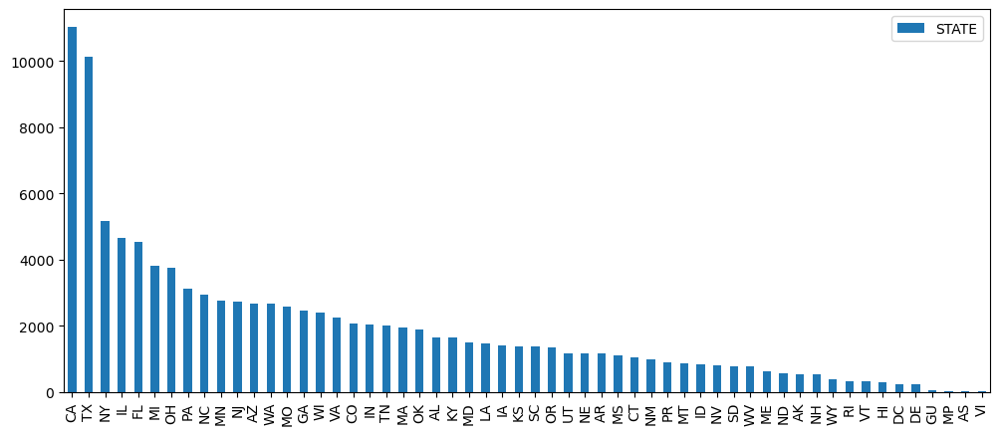

In [6]:
df['STATE'].value_counts().plot(figsize=(12, 5), kind='bar', legend=True)

In [7]:
df['TELEPHONE'].str.len().value_counts()

14    107299
Name: TELEPHONE, dtype: int64

In [8]:
df['area_code'] = df['TELEPHONE'].apply(lambda x: x.split()[0])

In [9]:
df['area_code'].value_counts() # .plot(figsize=(14, 5), kind='bar', legend=True)

(718)    1473
(281)     901
(787)     894
(972)     893
(360)     881
         ... 
(857)       1
(709)       1
(250)       1
(747)       1
(222)       1
Name: area_code, Length: 300, dtype: int64

In [10]:
df['POPULATION'].nsmallest(n=10)

OBJECTID
132     0.0
224     0.0
298     0.0
459     0.0
985     0.0
3373    0.0
4462    0.0
5989    0.0
6844    0.0
6937    0.0
Name: POPULATION, dtype: float64

In [11]:
from plotly.express import scatter
from numpy import log10
df['log_population'] = log10(1 + df['POPULATION'])
scatter(data_frame=df.sample(100000), y='LATITUDE', x='LONGITUDE', color='log_population', hover_name='NAME').show()

In [12]:
scatter(data_frame=df[df['STATE'] == 'CA'], y='LATITUDE', x='LONGITUDE', color='log_population', hover_name='NAME',
                hover_data=['ADDRESS', 'CITY', 'STATE', 'POPULATION', 'ENROLLMENT'],
       ).show()

In [13]:
scatter(data_frame=df[df['STATE'] == 'CA'], y='LATITUDE', x='LONGITUDE', color='area_code', hover_name='NAME',
                hover_data=['ADDRESS', 'CITY', 'STATE', 'POPULATION', 'ENROLLMENT'],
       ).show()

In [14]:
scatter(data_frame=df[(df['STATE'] == 'RI') & (df['log_population'].notnull())], y='LATITUDE', x='LONGITUDE', 
        color='log_population', hover_name='NAME',
        hover_data=['ADDRESS', 'CITY', 'STATE', 'POPULATION', 'ENROLLMENT'],
       ).show()

<Axes: ylabel='Frequency'>

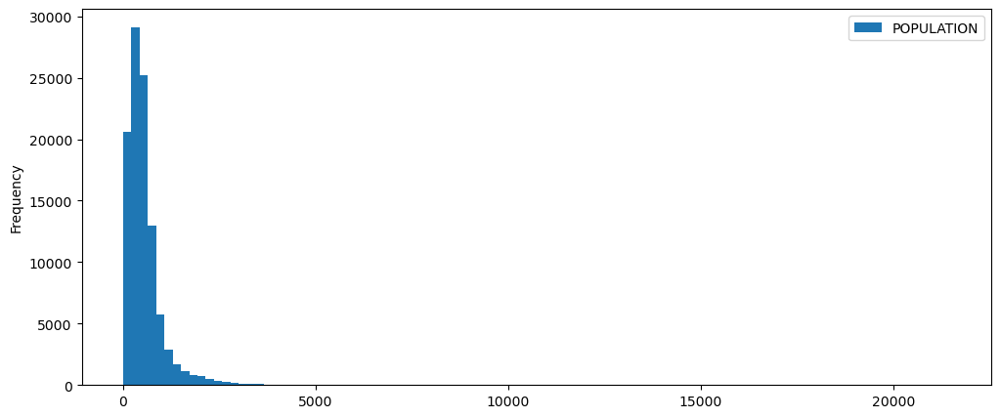

In [15]:
df[df['POPULATION'] > 0][['POPULATION']].plot.hist(bins=100, figsize=(12, 5), )

We can't see much in this graph

<Axes: ylabel='Frequency'>

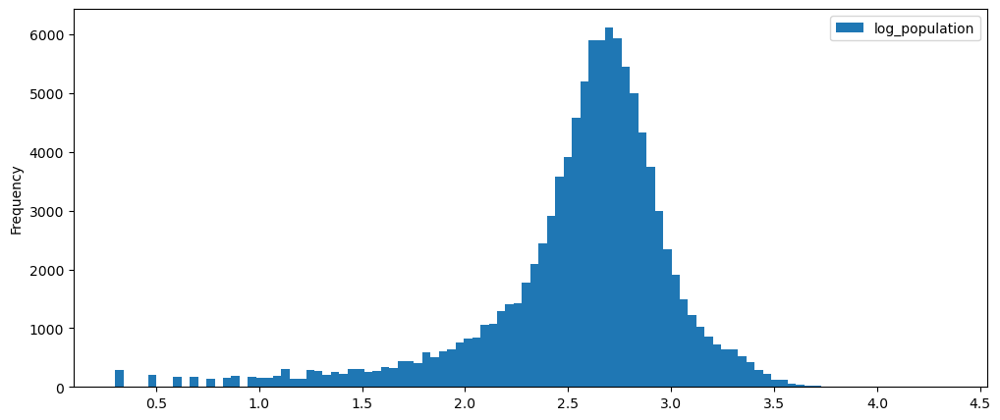

In [16]:
df[df['log_population'] > 0][['log_population']].plot.hist(bins=100, figsize=(12, 5))

This seems surprising at first but the US tends to have lots of smaller schools for lower grades, and there are some truly massive high schools.

In [17]:
df['TYPE'].value_counts()

1    97428
4     6050
2     2134
3     1687
Name: TYPE, dtype: int64

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning:

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5



<Axes: xlabel='log_population', ylabel='Density'>

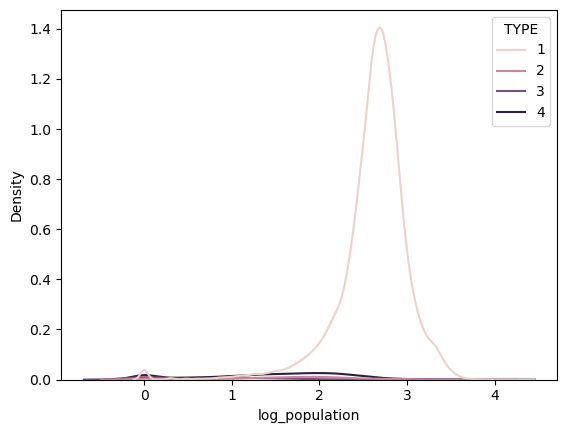

In [18]:
from seaborn import kdeplot
kdeplot(data=df, x='log_population', hue='TYPE')

In [19]:
df['extended_type'] = df['TYPE'].astype(str) + ' ' + df['ST_GRADE'].astype(str) + ' ' + df['END_GRADE']
df['extended_type'].value_counts()[:10]

1 PK 05    16890
1 09 12    14164
1 06 08    11055
1 KG 05    10726
1 PK 06     4881
1 KG 06     4361
1 KG 08     3754
1 PK 08     3737
1 07 12     2351
1 PK 04     2223
Name: extended_type, dtype: int64

<Axes: xlabel='POPULATION', ylabel='ENROLLMENT'>

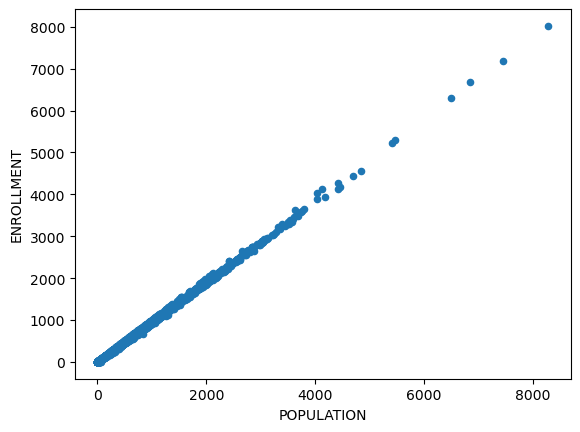

In [20]:
df.sample(10000).plot(kind='scatter', x='POPULATION', y='ENROLLMENT')

Population and enrollment aren't the same but they're very close and they do not seem to vary systematically.

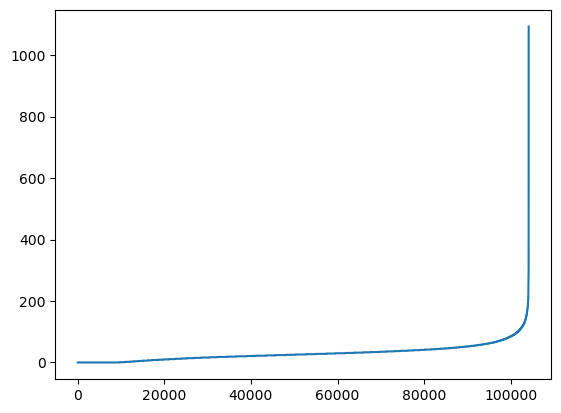

In [21]:
from matplotlib.pyplot import plot
df['population_error'] = df['POPULATION'] - df['ENROLLMENT']
plot(sorted(df.sort_values(by='population_error',)['population_error'].values.tolist()))